## Low Backscatter Thresholding (Otsu and LM)

- Operates on sigma nought images
- Use a metric called maximum between-class variance to determine bimodality
- Looking for bimodal histograms that have a clear divide between low backscatter and high backscatter
- Usually used for classifying water since water bodies tend to have low backscatter

### Max BCV<sup>1</sup>

$$M = \text{total number of pixels}, n_{i} = \text{number of pixels with value } i, N-1=\text{max pixel value}$$
$$t = \text{threshold to divide classes}$$

$$p(i) = n_i/M \text{(probability point function)}$$

Probability of classes
$$p_1(t) = \sum_{i=0}^t p(i), p_2(t) = \sum_{i=t+1}^{N-1} p(i)$$

Means of classes
$$m_1(t) = \sum_{i=0}^t \frac{ip(i)}{p_1(t)}, m_2(t) = \sum_{i=t+1}^{N-1} \frac{ip(i)}{p_2(t)}$$

Variance of classes
$$\sigma_1^2 = \sum_{i=0}^t (i-m_1(t))^2 \frac{p(i)}{p_1(t)}, \sigma_1^2 = \sum_{i=t+1}^{N-1} (i-m_2(t))^2 \frac{p(i)}{p_2(t)}$$

Between-class variance (BCV)
$$\sigma_B^2(t) = p_1(t)p_2(t)[m_1(t)-m_2(t)]$$

Normalized BCV
$$B(t) = \frac{\sigma_B^2}{\sigma_T^2}, \sigma_T^2 \text{ is total variance}$$

Max BCV
$$B_{max} = \max_{0 \leq t < N-1} B(t)$$

<sup>1</sup>O. Demirkaya, M.H. Asyali, “Determination of
image bimodality thresholds for different intensity
distributions,” Signal Processing: Image
Communication, doi:10.1016/j.image.2004.04.002,
2004.

### Ostu

- Uses minimum within-class variance (very similar computation to BCV) to find a threshold
- What Clay used, I refer to [here](http://www.labbookpages.co.uk/software/imgProc/otsuThreshold.html) for a good explanation
- Entirely implemented with `skimage.filters.threshold_otsu`

### Local Minimum (LM)

- This one I implemented
- Finds the minimum between 2 bimodal peaks (where slope is 0)
- May be numerically unstable
    - Use of 1D Gaussian convolution with filter [0.2261, 0.5478, 0.2261]<sup>2</sup>
    - Use of interpolant and its derivative (`scipy.interpolate.CubicSpline`)
    - Use of numerical root-finding (`scipy.optimize.fsolve`)
    
<sup>2</sup>Cao, H., Zhang, H., Wang, C., & Zhang, B. (2019). Operational flood detection using Sentinel-1 SAR data over large areas. Water, 11(4), 786.

In [1]:
import os
os.chdir('..')
from source.BimodalThreshold import BimodalThreshold
from source.Image import Image
import numpy as np
import matplotlib.pyplot as plt

# WARNING: I get rid of run time warnings since I get a lot in LM computations
import warnings
warnings.filterwarnings('ignore')

data_dir = os.getcwd()+'/data/bimodal_threshold'

In [2]:
img = Image(data_dir+'/20170806.norm3.ml.full.geo.filt1.tif')
img.read()

geographic_bounds = [-95.9, -95., 29.4, 29.7]
bt = BimodalThreshold(geographic_bounds)

In [3]:
img.quantile_clip(upper_quantile=0.99)
img.threshold_clip(lower=0.0)
img.map_to_interval(0,1)

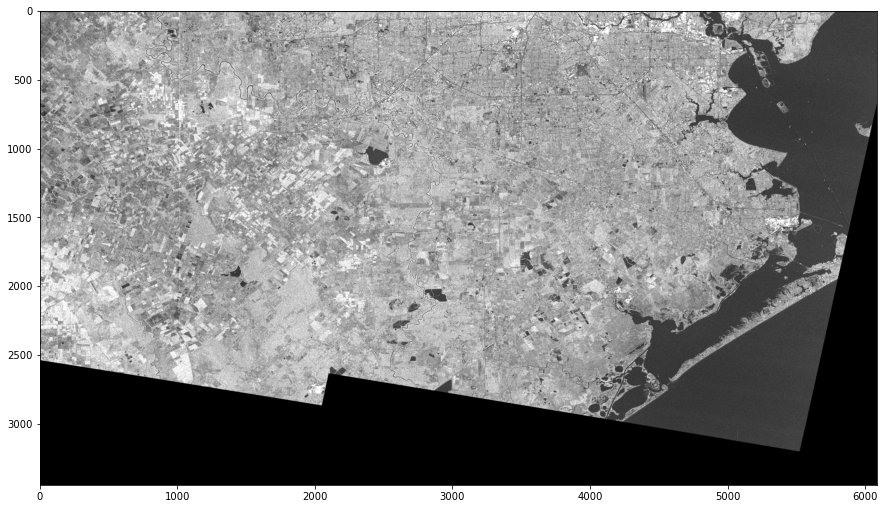

In [4]:
plt.figure(figsize=(15,15))
plt.imshow(img.band, cmap='gray')
plt.show()

In [5]:
window, sub_window = bt.get_window_size(img)
window, sub_window

(1456, 182)

Working on /home/csimmons/Research/SAR-Methods/data/bimodal_threshold/20170806.norm3.ml.full.geo.filt1.tif


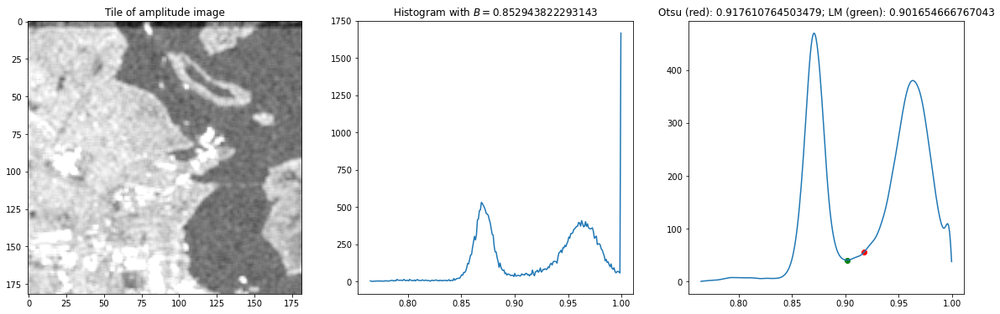

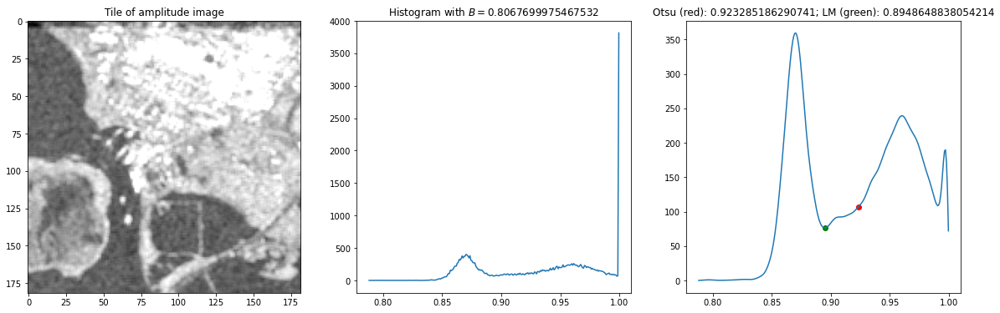

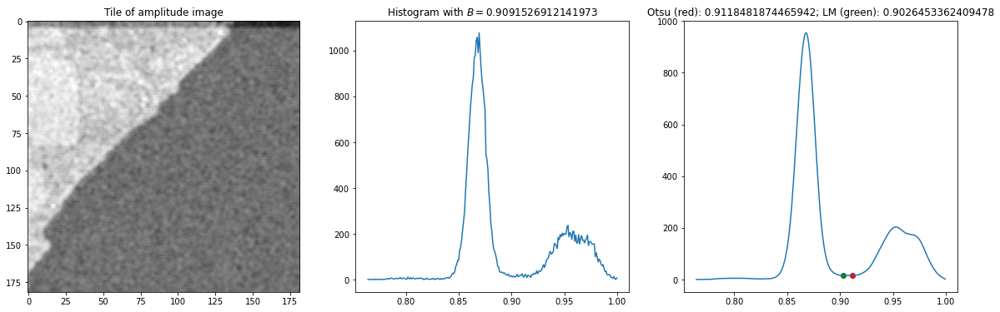

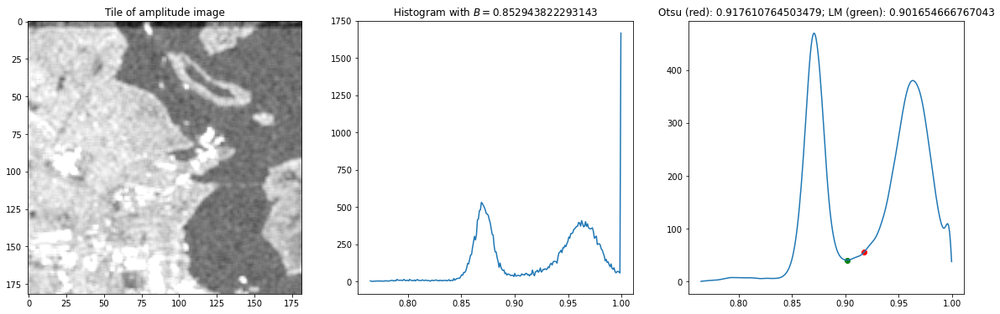

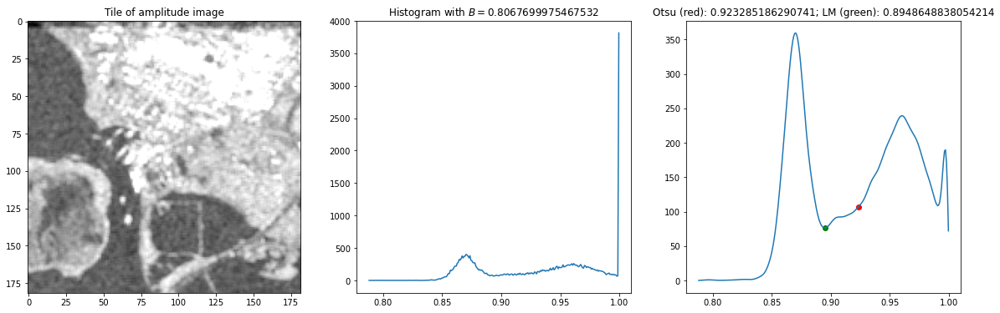

...

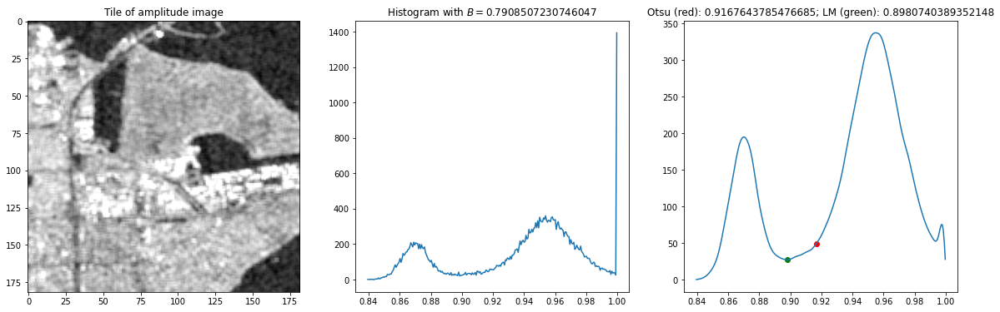

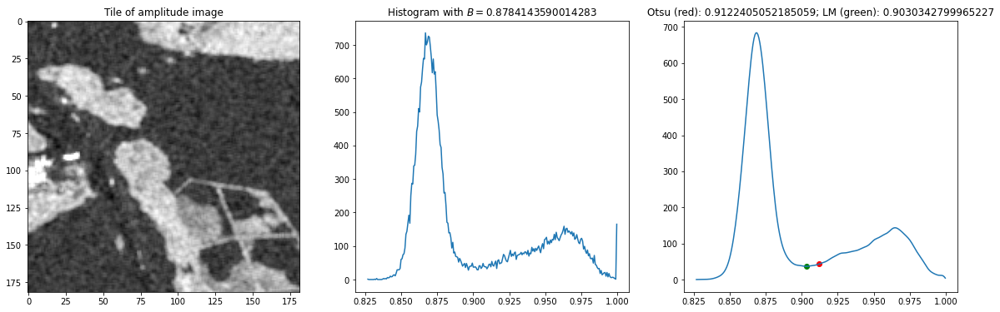

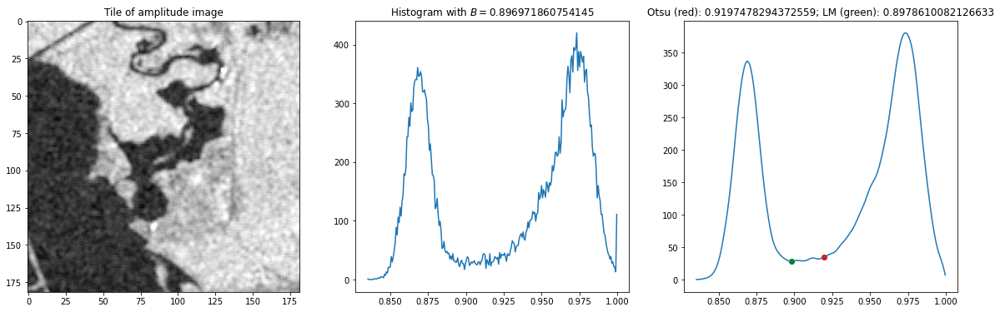

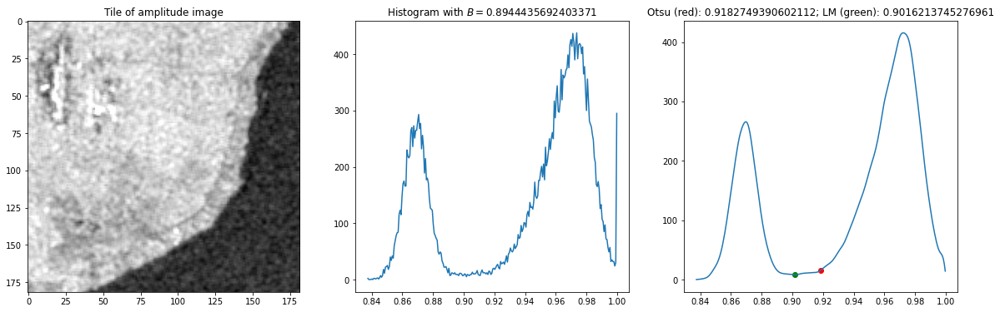

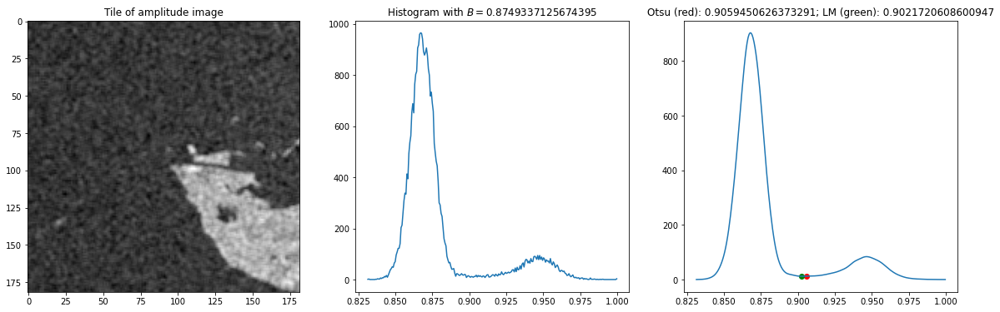

In [6]:
otsus, lms = bt.otsu_and_lm([img], block_dim=window, s=sub_window, verbose=True)

In [7]:
lm = np.mean(lms)
lm

0.9002500258843822

In [8]:
lm_map = np.where(img.band < lm, 1, 0)

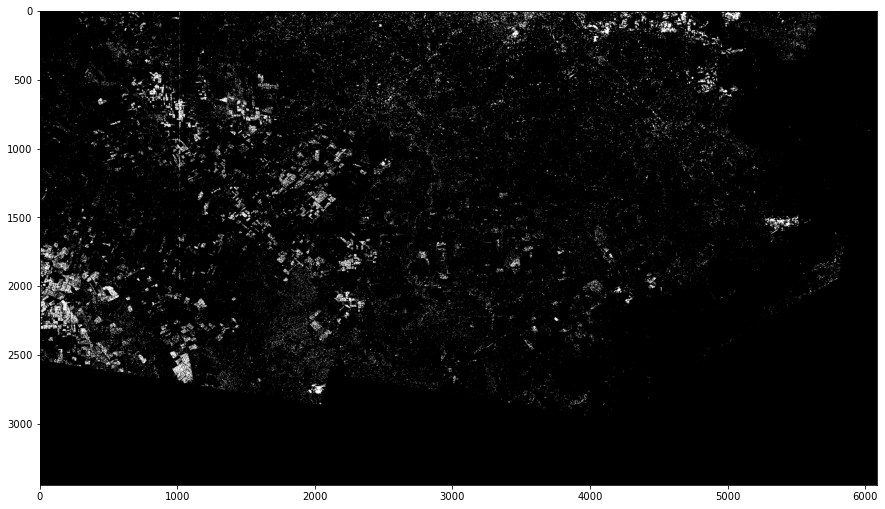

In [9]:
plt.figure(figsize=(15,15))
plt.imshow(lm_map, cmap='binary')
plt.show()

This algorithm is not performing well with ISCE data.